In [92]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(25,10)})
from sklearn.preprocessing import RobustScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# St Pierre des Corps : TGV station

In [97]:
df_25 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_25.csv")
# Convert 'date' column to datetime data type
df_25['date'] = pd.to_datetime(df_25['date'])

# Reshape the DataFrame using melt
df_melted = df_25.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl', 'booking_fees'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl', 'booking_fees']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 25"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

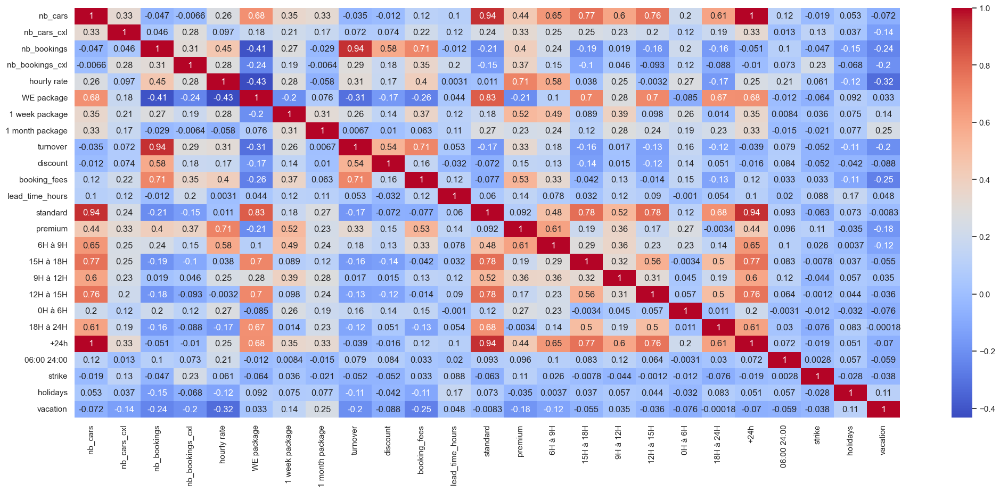

In [80]:
# Keep only numerical columns
numeric_cols = df_25.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()


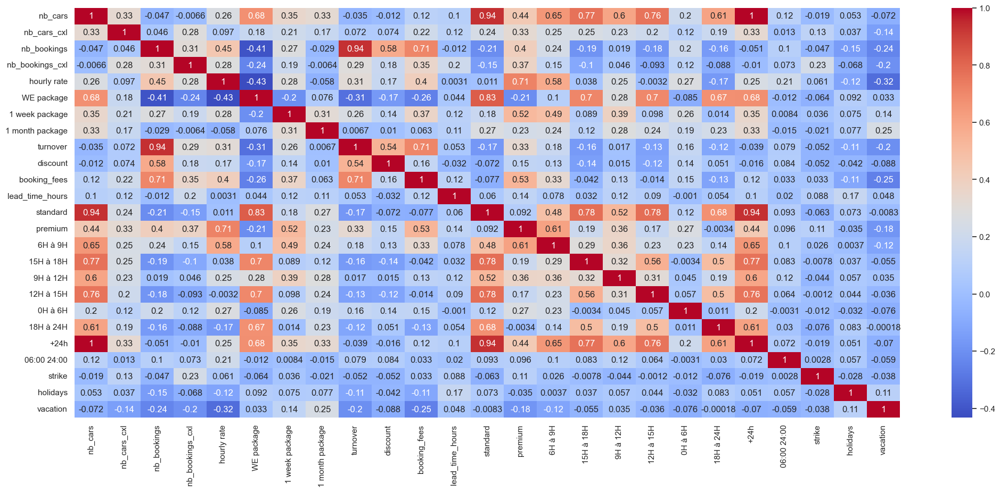

In [90]:
# Keep only numerical columns
numeric_cols = df_25.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Robust scaling
scaler = RobustScaler()
scaled_data = scaler.fit_transform(non_zero_cols)

# Convert scaled data back to a DataFrame
scaled_df = pd.DataFrame(scaled_data, columns=non_zero_cols.columns)

# Prepare matrix
corr_matrix = scaled_df.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()


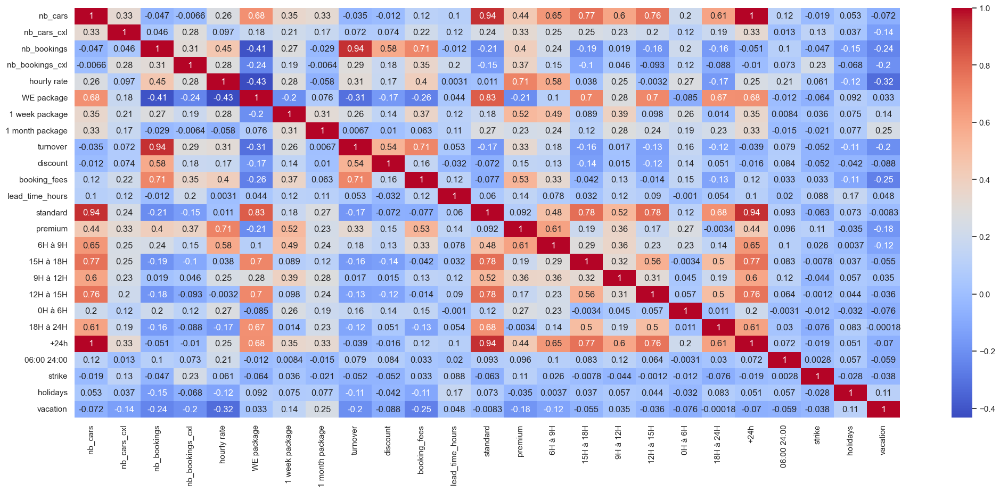

In [91]:
from sklearn.preprocessing import StandardScaler

# Keep only numerical columns
numeric_cols = df_25.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Standard scaling
scaler = StandardScaler()
scaled_data = scaler.fit_transform(non_zero_cols)

# Convert scaled data back to a DataFrame
scaled_df = pd.DataFrame(scaled_data, columns=non_zero_cols.columns)

# Compute correlation matrix
corr_matrix = scaled_df.corr()

# Plot correlation heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()


In [94]:
# Keep only numerical columns
numeric_cols = df_25.select_dtypes(include=[np.number])

# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data['Variable'] = numeric_cols.columns
vif_data['VIF'] = [variance_inflation_factor(numeric_cols.values, i) for i in range(numeric_cols.shape[1])]

# Display the VIF data sorted
vif_data_sorted = vif_data.sort_values(by='VIF', ascending=False)
print(vif_data_sorted)



/Users/anaisetienne/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/anaisetienne/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1738: RuntimeWarning:

invalid value encountered in double_scalars



           Variable        VIF
0           nb_cars        inf
15          premium        inf
23      06:00 24:00        inf
22             +24h        inf
21        18H à 24H        inf
20          0H à 6H        inf
19        12H à 15H        inf
18         9H à 12H        inf
17        15H à 18H        inf
16          6H à 9H        inf
14         standard        inf
7   1 month package        inf
6    1 week package        inf
5        WE package        inf
4       hourly rate        inf
2       nb_bookings  37.668596
10         turnover  31.702155
12     booking_fees   5.845609
13  lead_time_hours   3.216032
1       nb_cars_cxl   2.609764
11         discount   2.527878
28         vacation   2.338964
3   nb_bookings_cxl   2.248292
27         holidays   1.135952
26           strike   1.125800
8     other package        NaN
9   2 weeks package        NaN
24      00:30 06:00        NaN
25      00:00 00:30        NaN


- 0,58 between discount & nb of bookings 
- 0,25 1 month package during vacation
- 0,23 nb_bookings_cxl during strikes

# St Pierre des corps without premium bookings

In [100]:
df_25std = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_25std.csv")
df_25std['date'] = pd.to_datetime(df_25std['date'])


df_melted = df_25std.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl', 'booking_fees'])

fig = go.Figure()

for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl', 'booking_fees']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 25 -  without premium bookings"
)

fig.update_layout(height=800)

fig.show()


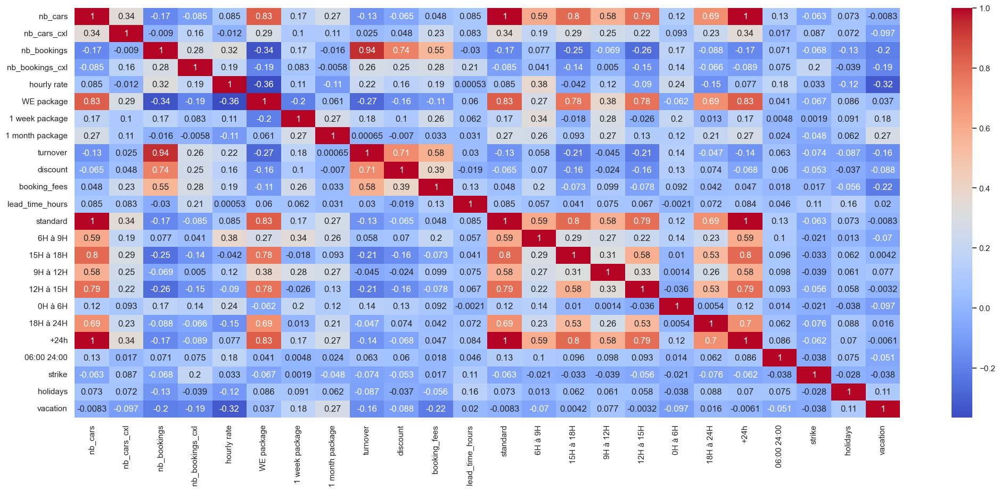

In [101]:
# Keep only numerical columns
numeric_cols = df_25std.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()


In [102]:
# Keep only numerical columns
numeric_cols = df_25std.select_dtypes(include=[np.number])

# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data['Variable'] = numeric_cols.columns
vif_data['VIF'] = [variance_inflation_factor(numeric_cols.values, i) for i in range(numeric_cols.shape[1])]

# Display the VIF data sorted
vif_data_sorted = vif_data.sort_values(by='VIF', ascending=False)
print(vif_data_sorted)

/Users/anaisetienne/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/anaisetienne/.pyenv/versions/3.10.6/envs/lewagon/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1738: RuntimeWarning:

invalid value encountered in double_scalars



           Variable        VIF
0           nb_cars        inf
16          6H à 9H        inf
23      06:00 24:00        inf
22             +24h        inf
21        18H à 24H        inf
20          0H à 6H        inf
19        12H à 15H        inf
18         9H à 12H        inf
17        15H à 18H        inf
14         standard        inf
7   1 month package        inf
6    1 week package        inf
5        WE package        inf
4       hourly rate        inf
2       nb_bookings  33.029295
10         turnover  30.011186
11         discount   2.835242
13  lead_time_hours   2.522678
12     booking_fees   2.438417
1       nb_cars_cxl   2.414682
28         vacation   2.295000
3   nb_bookings_cxl   1.950285
27         holidays   1.127529
26           strike   1.107738
8     other package        NaN
9   2 weeks package        NaN
15          premium        NaN
24      00:30 06:00        NaN
25      00:00 00:30        NaN


# Angouleme : train & city

In [27]:
df_34 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_34.csv")
# Convert 'date' column to datetime data type
df_34['date'] = pd.to_datetime(df_34['date'])

# Reshape the DataFrame using melt
df_melted = df_34.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 34"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

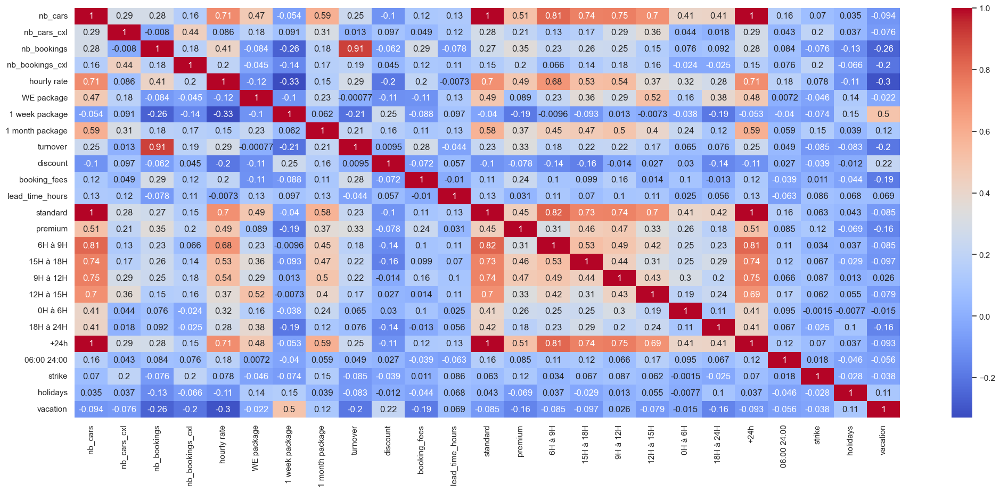

In [81]:
# Keep only numerical columns
numeric_cols = df_34.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,22 impact of discount during vacation 
- 0,5 high impact of 1 week package during vacation 
- 0,2 between stike & cancelations 

# Massy : TGV station

In [28]:
df_36 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_36.csv")
# Convert 'date' column to datetime data type
df_36['date'] = pd.to_datetime(df_36['date'])

# Reshape the DataFrame using melt
df_melted = df_36.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 36"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

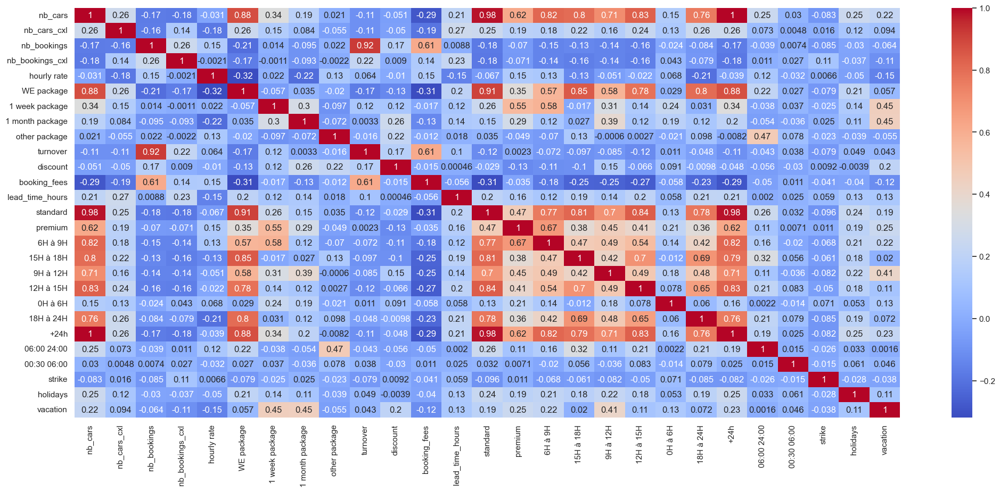

In [82]:
# Keep only numerical columns
numeric_cols = df_36.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,45 1 week package & 1 month package during vacations
- 0,2 discount during vacation 
- 0,11 cancelations during strikes

# La Rochelle : train station & city

In [29]:
df_52 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_52.csv")
# Convert 'date' column to datetime data type
df_52['date'] = pd.to_datetime(df_52['date'])

# Reshape the DataFrame using melt
df_melted = df_52.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 52"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

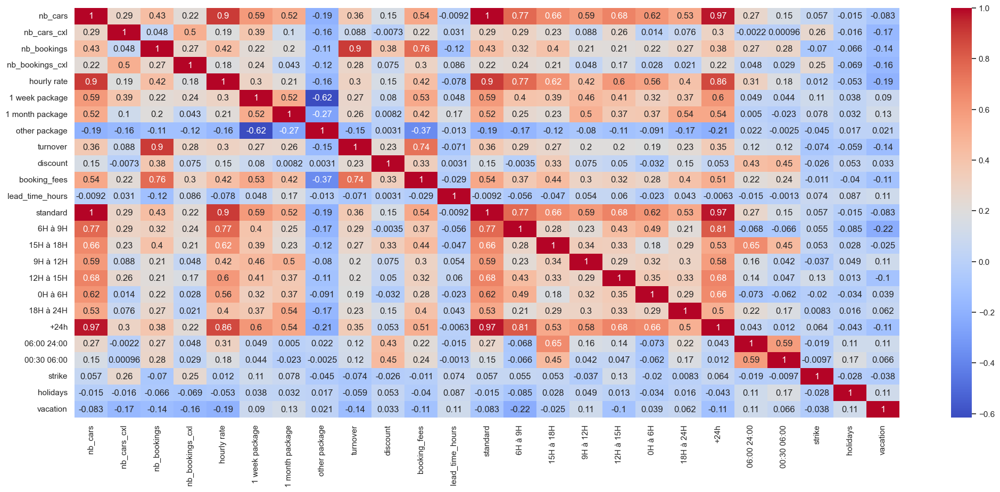

In [83]:
# Keep only numerical columns
numeric_cols = df_52.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()


- 0,25 cancellation during strikes
- 0,13 1 month package & 0,09 1 week package during vacation
- only 0,033 discount during vacation 


# Paris Rome Batignolles : city center

In [30]:
df_95 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_95.csv")
# Convert 'date' column to datetime data type
df_95['date'] = pd.to_datetime(df_95['date'])

# Reshape the DataFrame using melt
df_melted = df_95.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 95"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

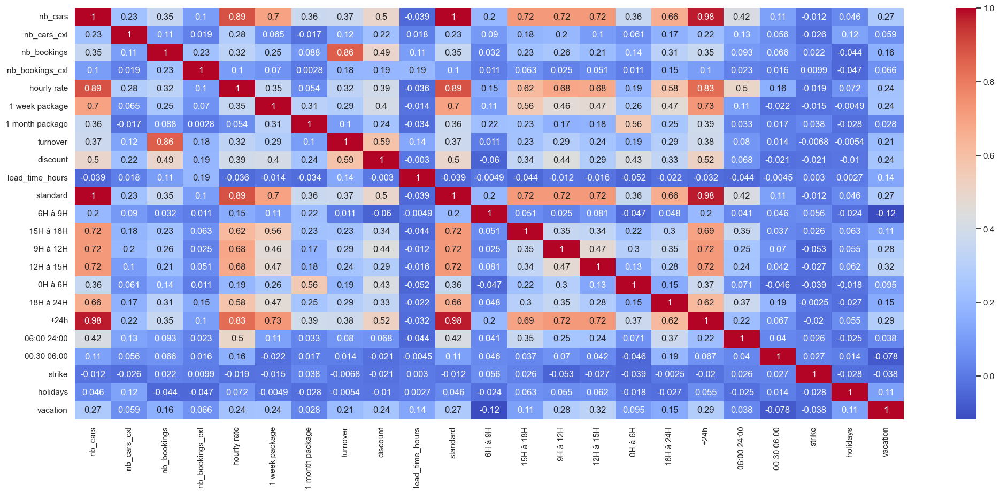

In [84]:
# Keep only numerical columns
numeric_cols = df_95.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- no impact of strikes
- 0,24 between vacation & discount
- 0,49 between discount & nb of bookings


# Paris gare du Nord : train station & city center

In [31]:
df_180 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_180.csv")
# Convert 'date' column to datetime data type
df_180['date'] = pd.to_datetime(df_180['date'])

# Reshape the DataFrame using melt
df_melted = df_180.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 180"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

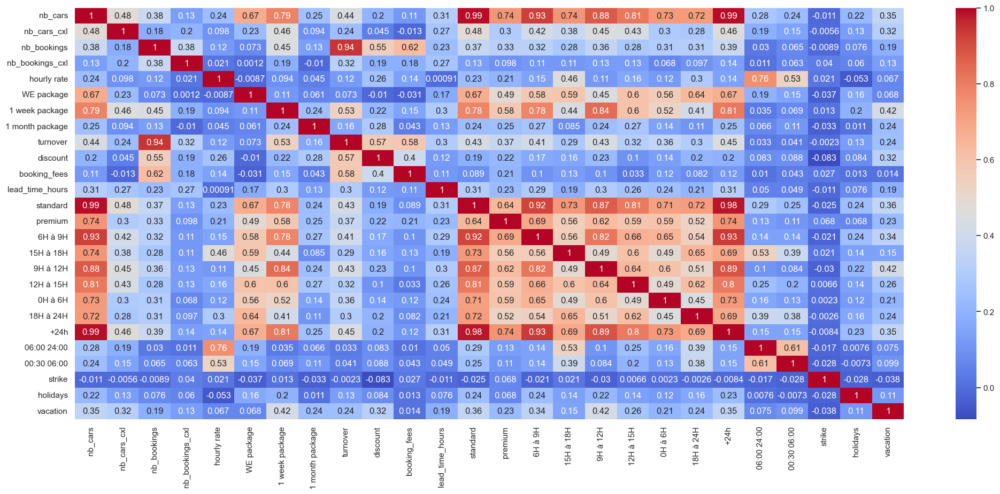

In [86]:
# Keep only numerical columns
numeric_cols = df_180.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,04 between strikes & nb_bookings_cxl : not so impacted
- 0,42 1 week package during vacation & 0,24 1 month package
- 0,32 discount & vacation
- 0,55 between discount & nb of bookings
- 0,62 between booking fees & nb of bookings

# Marseille St Charles : train station & city center

In [32]:
df_206 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_206.csv")
# Convert 'date' column to datetime data type
df_206['date'] = pd.to_datetime(df_206['date'])

# Reshape the DataFrame using melt
df_melted = df_206.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 206"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

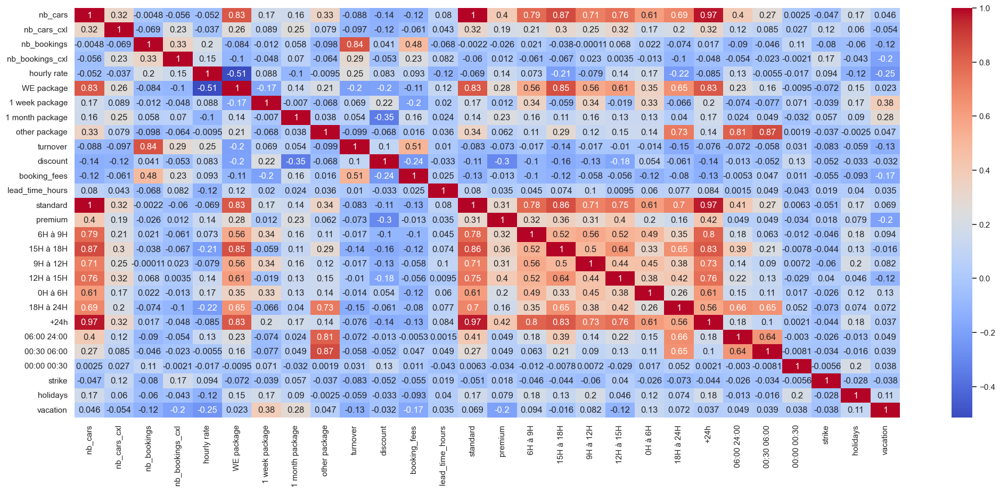

In [87]:
# Keep only numerical columns
numeric_cols = df_206.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,48 between booking fees & nb of bookings
- 0,17 between strikes & nb_bookings_cxl
- 0,38 1 week package & 0,28 1 month package during vacation
- 0,041 between discount & nb of bookings -> no impact 

# Aix P11 (low cost) : TGV station

In [33]:
df_272 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_272.csv")
# Convert 'date' column to datetime data type
df_272['date'] = pd.to_datetime(df_272['date'])

# Reshape the DataFrame using melt
df_melted = df_272.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 272"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

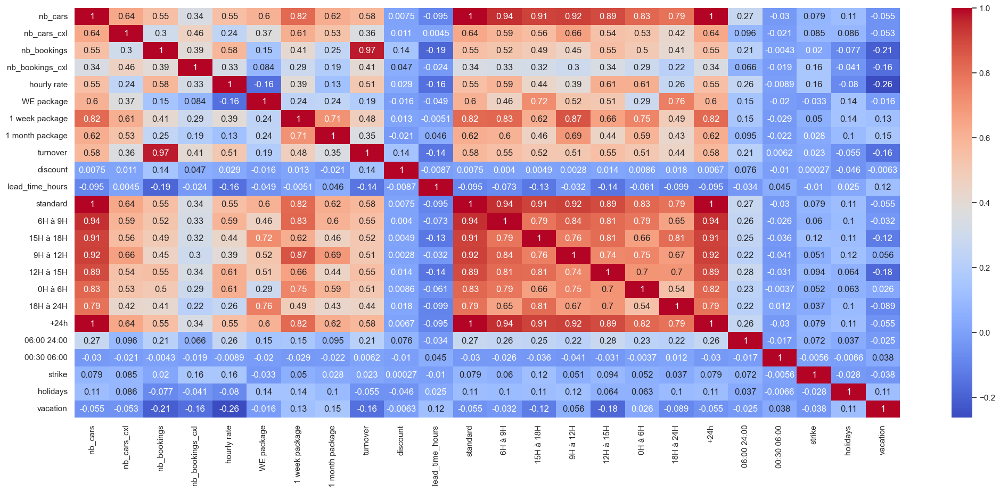

In [88]:
# Keep only numerical columns
numeric_cols = df_272.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,14 between discount & nb bookings
- 0,16 between nb_bookings_cxl & strikes
- 0,13 1 week package during vacation & 0,15 1 month package

# Aix TGV P1 (premium) : TGV station

In [34]:
df_287 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_287.csv")
# Convert 'date' column to datetime data type
df_287['date'] = pd.to_datetime(df_287['date'])

# Reshape the DataFrame using melt
df_melted = df_287.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 287"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

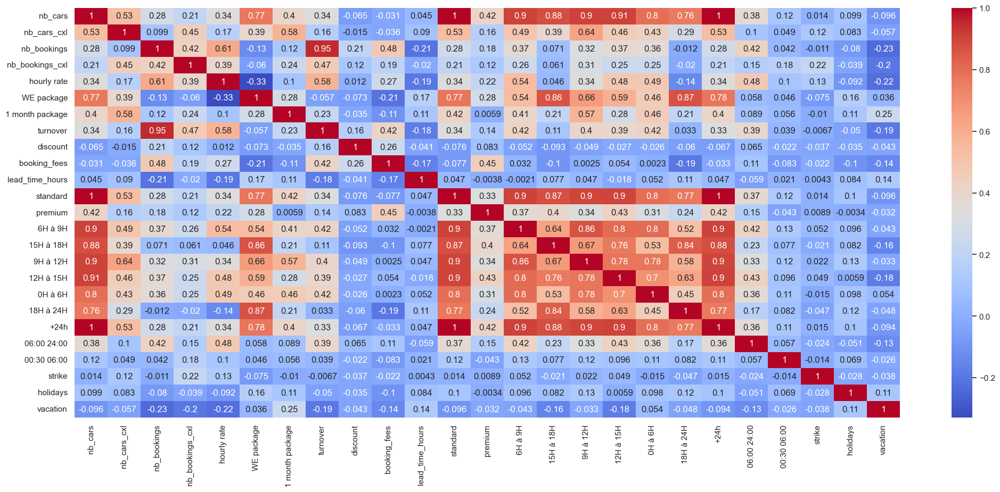

In [73]:
# Keep only numerical columns
numeric_cols = df_287.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,21 between discount & nb_bookings
- 0,22 cxl during strikes
- 0,25 1 month package during vacation
- 0,48 between booking fees & nb of bookings

# Dijon : train station & city center

In [35]:
df_368 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_368.csv")
# Convert 'date' column to datetime data type
df_368['date'] = pd.to_datetime(df_368['date'])

# Reshape the DataFrame using melt
df_melted = df_368.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 368"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

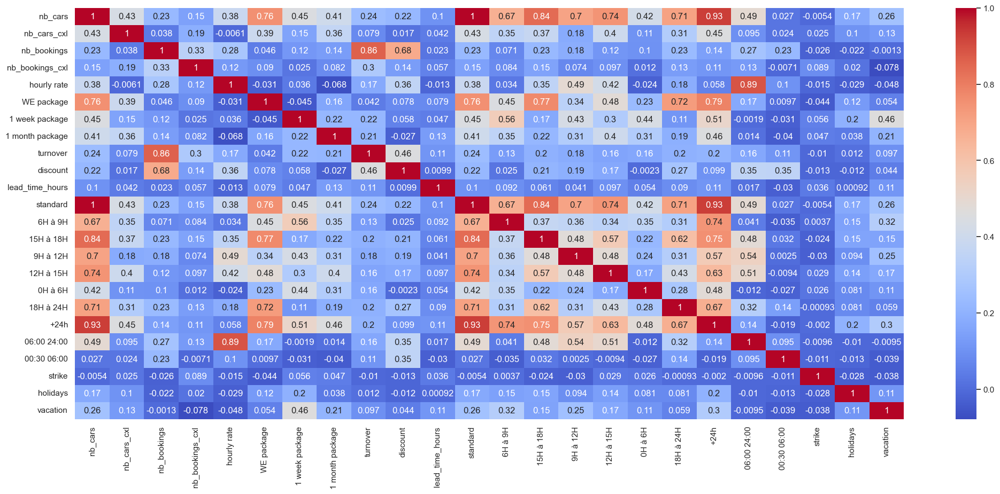

In [74]:
# Keep only numerical columns
numeric_cols = df_368.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,68 between discount & nb of bookings
- no impact of strikes on nb of bookings (0,089)
- 0,46 between 1 week package & vacation & 0,21 1 month package


# Aix P13 (super low cost) : TGV station

In [36]:
df_781 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_781.csv")
# Convert 'date' column to datetime data type
df_781['date'] = pd.to_datetime(df_781['date'])

# Reshape the DataFrame using melt
df_melted = df_781.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 781"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

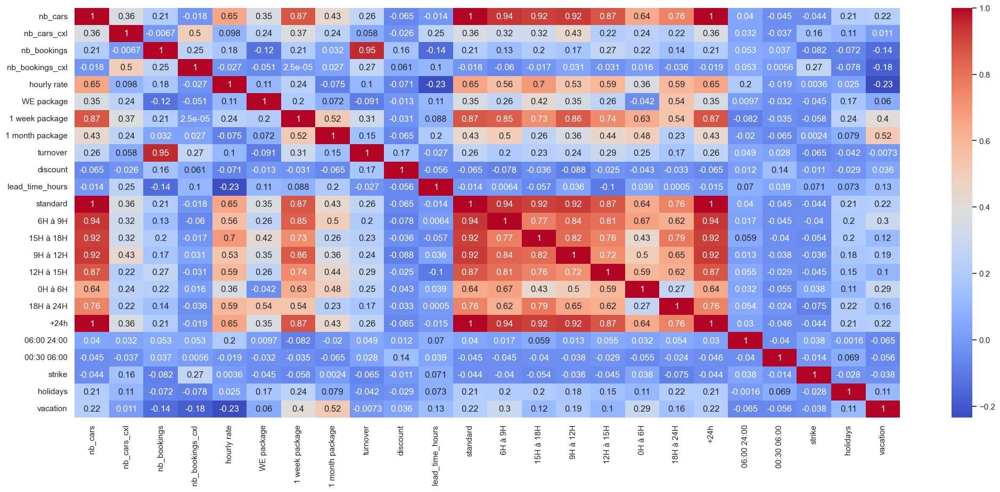

In [75]:
# Keep only numerical columns
numeric_cols = df_781.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,16 between discount & nb of bookings
- 0,27 between bookings_cxl & strikes
- 0,52 between 1 month package & vacation & 0,4 with 1 week package

# Montpellier Sud de France : TGV station

In [37]:
df_875 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_875.csv")
# Convert 'date' column to datetime data type
df_875['date'] = pd.to_datetime(df_875['date'])

# Reshape the DataFrame using melt
df_melted = df_875.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 875"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

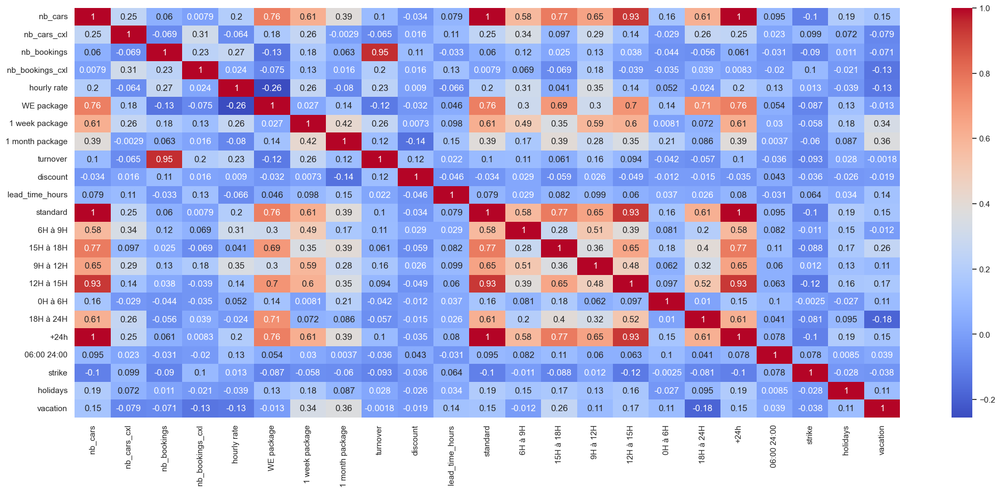

In [76]:
# Keep only numerical columns
numeric_cols = df_875.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,11 between discount & nb_bookings
- 0,1 between strikes & cxl
- 0,36 between 1 month package & 0,34 with 1 week package & vacation

# Avignon P2-P3 (standard) : TGV station

In [38]:
df_1435 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_1435.csv")
# Convert 'date' column to datetime data type
df_1435['date'] = pd.to_datetime(df_1435['date'])

# Reshape the DataFrame using melt
df_melted = df_1435.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 1435"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

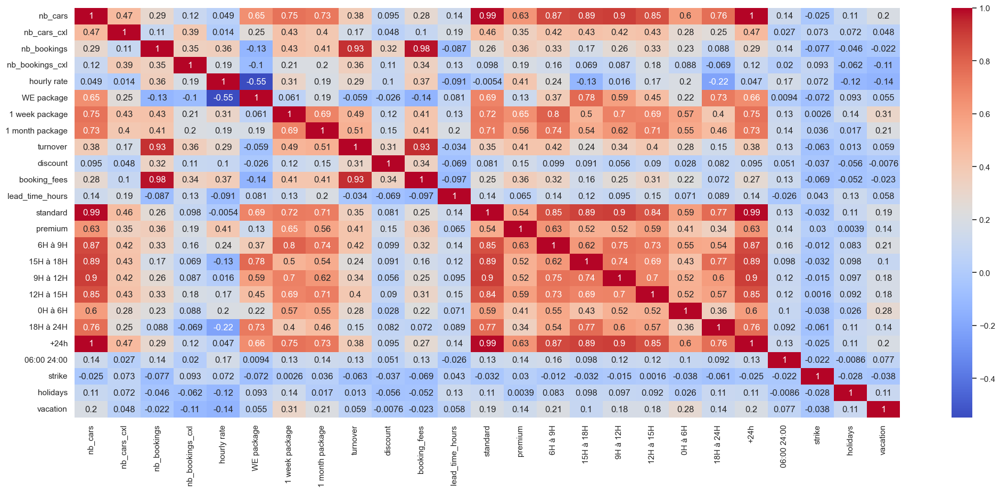

In [77]:
# Keep only numerical columns
numeric_cols = df_1435.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,32 between discount & nb bookings
- 0,093 between strikes & nb_bookings_cxl : no impact
- 0,31 between 1 week package and vacation & 0,21 with 1 month package

# Avignon P6 (low cost) : TGV station

In [39]:
df_5435 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_5435.csv")
# Convert 'date' column to datetime data type
df_5435['date'] = pd.to_datetime(df_5435['date'])

# Reshape the DataFrame using melt
df_melted = df_5435.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 5435"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

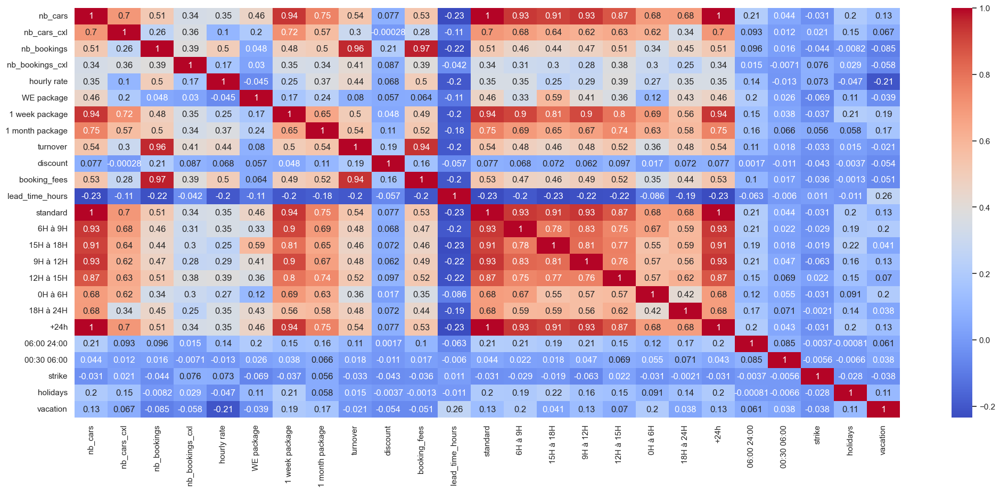

In [78]:
# Keep only numerical columns
numeric_cols = df_5435.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,21 between discount & nb bookings


# Aix P8 (standard) : TGV station

In [40]:
df_6287 = pd.read_csv("../prepared_data/01_06_2021_to_20_06_2023_prepared_df_6287.csv")
# Convert 'date' column to datetime data type
df_6287['date'] = pd.to_datetime(df_6287['date'])

# Reshape the DataFrame using melt
df_melted = df_6287.melt(id_vars='date', value_vars=['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl'])

# Create the line plot
fig = go.Figure()

# Add traces for each variable
for variable in ['nb_cars', 'nb_cars_cxl', 'nb_bookings', 'nb_bookings_cxl']:
    fig.add_trace(go.Scatter(
        x=df_melted['date'],
        y=df_melted[df_melted['variable'] == variable]['value'],
        name=variable
    ))

# Add range slider and selectors
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True)
    ),
    title="Number of cars and bookings per day - park 6287"
)

# Set the height of the plot
fig.update_layout(height=800)

# Show the graph
fig.show()

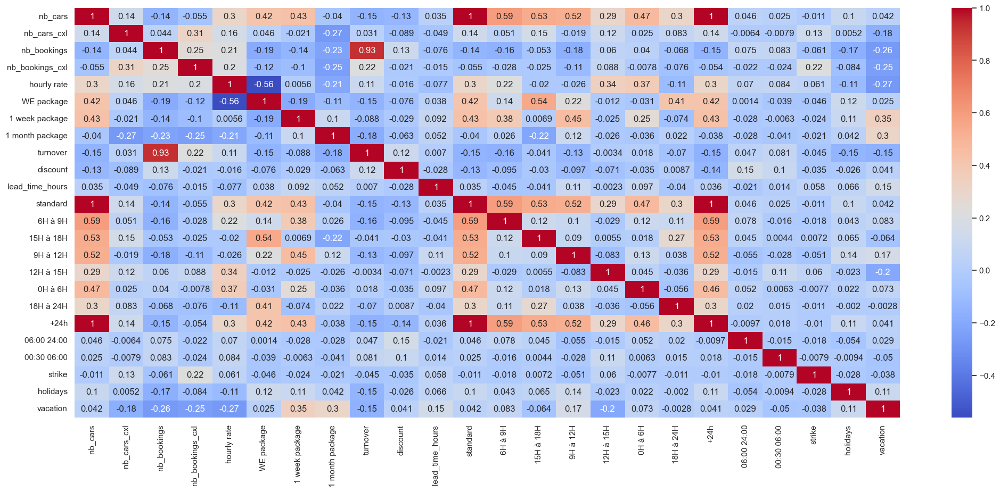

In [79]:
# Keep only numerical columns
numeric_cols = df_6287.select_dtypes(include=[np.number])

# Remove columns with only zeros
non_zero_cols = numeric_cols.loc[:, (numeric_cols != 0).any()]

# Prepare matrix
corr_matrix = non_zero_cols.corr()

# Show the matrix
sns.heatmap(corr_matrix, annot=True,cmap='coolwarm')
plt.show()

- 0,13 between discount & nb bookings
- 0,22 between strikes & nb_bookings_cxl
- 0,35 between 1 week package & 0,3 1 month package & vacation
